<a href="https://colab.research.google.com/github/Margaret4/Inventario_ASPNET/blob/main/Copy_of_Finetuning_with_Pre_Trained_Headless_Mobilenet_v2_for_Crop_Disease_Classification_Agriculture_Domain_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Info
This is a deep learning project in the field of agriculture. 

Each year, farmers suffer economic losses and crop loss as a result of different illnesses. **We will utilize mobilenet_v2 Convolutional Neural Network which is pre-trained on the ImageNet dataset and Finetune it with plant disease image dataset**. The goal is to classify images and develop an app/mobile app that will allow farmers to snap a picture of a plant and the app will determine whether the plant has a disease or not. 

Here we'll be doing potato disease classification.
- Dataset consist of **leaf images** from healthy potato plants and diseased potato plants (Early blight and Late blight)
- 3 classes
  - Early blight, Late blight, Healthy

This project's technology stack will include the following:
- Tensorflow with Keras API
- TF dataset
- Data Augmentation
- mobilenet_v2 model pre-trained on the ImageNet dataset.
- Tensorflow Lite (Useful for mobile dev)

# Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


GPU

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Oct 15 02:51:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Downloading Plant Disease Image dataset from Kaggle using the Kaggle API

In [ ]:
!ls 

gdrive	sample_data


In [ ]:
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

api_token = {"username":"margaretancco","key":"b247117c0e104458494d447a88ff8a48"}

import json

with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)

!chmod 600 ~/.kaggle/kaggle.json

! pip install -q kaggle
# ! mkdir ~/.kaggle
# ! cp '/content/drive/MyDrive/Colab_Notebooks/kaggle.json' ~/.kaggle/kaggle.json

# ! chmod 600 ~/.kaggle/kaggle.json # Allocate the required permission for this file.
! kaggle datasets download arjuntejaswi/plant-village
! unzip -q plant-village.zip

 98% 321M/329M [00:08<00:00, 42.7MB/s]
100% 329M/329M [00:08<00:00, 39.2MB/s]


# Only keeping the Potato disease image folders

In [ ]:
import os
! rm -rf ./PlantVillage/Pepper*/ ./PlantVillage/Tomato*/
os.listdir('PlantVillage')

['Potato___Late_blight', 'Potato___Early_blight', 'Potato___healthy']

# Import Tensorflow and Keras API
Keras is the high-level API of TensorFlow 2
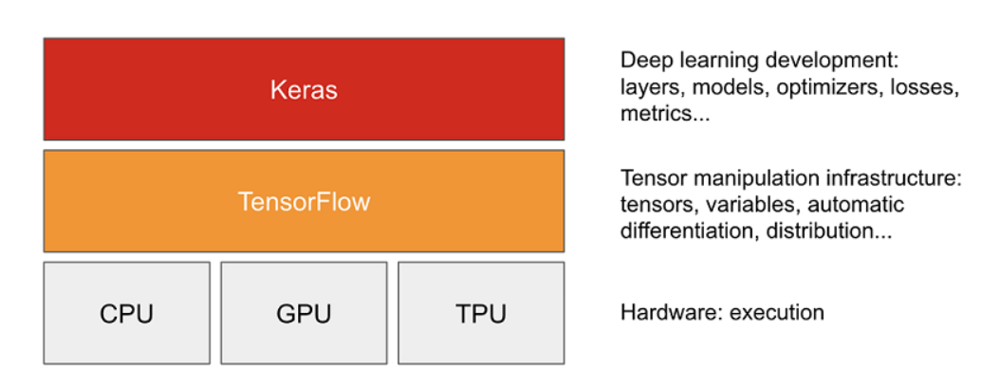

In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

# check device for tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


# Set parameters for training

In [ ]:
IMG_SIZE = 224 #@param {type:"integer"} # 256
BATCH_SIZE = 64 #@param {type:"integer"}
CHANNELS = 3 #@param {type:"integer"}

# image_dataset_from_directory api to load all images in tensorflow dataset

In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    shuffle=True,
    image_size = (IMG_SIZE, IMG_SIZE),
    batch_size = BATCH_SIZE
)
class_names = dataset.class_names
print(f"class names: {class_names}")
print(f"len of dataset: {len(dataset)}")

Found 2152 files belonging to 3 classes.
class names: ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']
len of dataset: 34


## Display few images

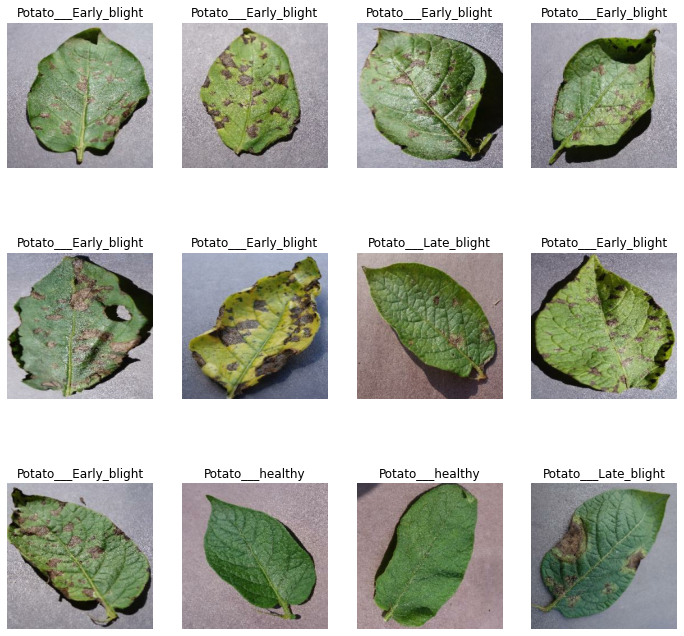

In [ ]:
plt.figure(figsize=(12,12))

for image_batch, label_batch in dataset.take(1):
  for i in range(12):
    ax = plt.subplot(3,4,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8")) # convert float img data to int since values between [0..255]
    plt.title(class_names[label_batch[i]]) # label_batch[i] provides numerical class value for e.g. 0,1,2
    plt.axis("off")

# Creating train, val, test datasets and optimizing them for training performance

In [ ]:
def get_ds_partitions(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):

  ds_size = len(ds)

  if shuffle:
    ds = ds.shuffle(shuffle_size, seed=6)

  train_size = int(train_split * ds_size)
  val_size = int(val_split * ds_size)

  train_ds = ds.take(train_size)
  val_ds = ds.skip(train_size).take(val_size)
  test_ds = ds.skip(train_size).skip(val_size) # take the leftover in the test_ds

  return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_ds_partitions(dataset)
# caching will read the image and for next iteration keep the image in the memory (No reading the same image in the next iteration again, improves performance)
# prefetch will utilize the cpu to load the next batch from the disk while gpu is busy training (So cpu doesn't stay idle)
# AUTOTUNE lets tensorflow to determine how many batches to load utilizing cpu while gpu is busy training
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) 
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) 
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) 

print(f"train_ds: {train_ds}")
print(f"val_ds: {val_ds}")
print(f"test_ds: {test_ds}")

train_ds: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
val_ds: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
test_ds: <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


# Data Augmentation

In [ ]:
# resize and rescale layer
resize_rescale = tf.keras.Sequential([
                     # during prediction if you supplying image which is not 224x224 the resizing layer will take care of it
                     layers.experimental.preprocessing.Resizing(IMG_SIZE,IMG_SIZE),
                     layers.experimental.preprocessing.Rescaling(1.0/255)
])

# data augmentation layer
data_augmentation = tf.keras.Sequential([
                     # during prediction if you supplying image which is rotated or of different contrast then it is useful to train the
                     # the model on augmented (rotated, different contrast) images, cause it will make the model robust against variations
                     # such as rotated image or higher contrast image during prediction phase
                     layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
                     layers.experimental.preprocessing.RandomRotation(0.2)
])



---



---



---



# Finetuning

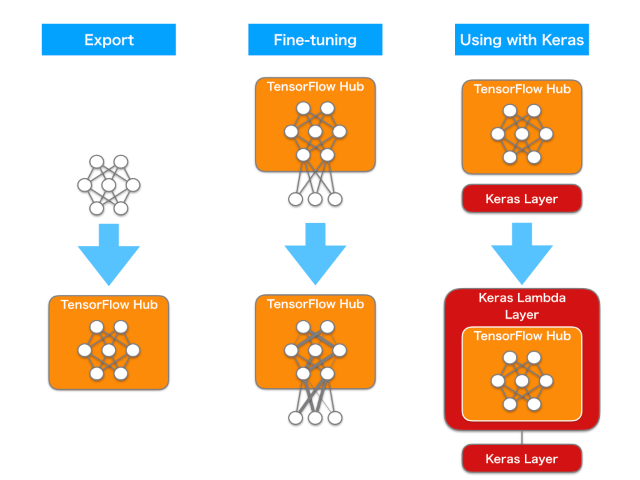
## Download the headless pre-trained model
- TensorFlow Hub distributes models without the top classification layer. These can be used to easily perform transfer learning.
  - Image feature vector model for the pre-trained model available from TensorFlow Hub.
- Create the feature extractor by wrapping the pre-trained model as a Keras layer with hub.KerasLayer. 
  - hub.KerasLayer Wraps a SavedModel as a Keras Layer.
  - Use the trainable=False argument to freeze the variables, so that the training only modifies the new classifier layer

In [ ]:
import tensorflow_hub as hub

mobilenet_v2 = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4" # useful for mobile dev

feature_extractor_model = mobilenet_v2

IMG_SHAPE = (IMG_SIZE, IMG_SIZE, CHANNELS)

feature_extractor_layer = hub.KerasLayer(
    feature_extractor_model,
    input_shape=IMG_SHAPE,
    trainable=False)

## Feature Batch
The feature extractor returns a 1280-long vector for each image

In [ ]:
import numpy as np

for image_batch, label_batch in train_ds.take(1):
  feature_batch = resize_rescale(image_batch)
  print(f"after resizing and rescaling: {np.shape(feature_batch)}")
  print("\n")
  feature_batch = feature_extractor_layer(feature_batch)
  print(f"after feature extraction layer: {feature_batch.shape}")

after resizing and rescaling: (64, 224, 224, 3)


after feature extraction layer: (64, 1280)


## Model
Attach a classification head

In [ ]:
num_classes = len(class_names)
input_shape = (BATCH_SIZE, IMG_SIZE, IMG_SIZE, CHANNELS)

model = tf.keras.Sequential([
  resize_rescale, # data augmentation layer
  data_augmentation, # data augmentation layer
  feature_extractor_layer,
  tf.keras.layers.Dense(num_classes)
])

model.build(input_shape=input_shape)
model.summary()

print(f"**example shape of the output from model: {model(image_batch).shape}") # test shape of output

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (64, 224, 224, 3)         0         
                                                                 
 sequential_1 (Sequential)   (64, 224, 224, 3)         0         
                                                                 
 keras_layer (KerasLayer)    (64, 1280)                2257984   
                                                                 
 dense (Dense)               (64, 3)                   3843      
                                                                 
Total params: 2,261,827
Trainable params: 3,843
Non-trainable params: 2,257,984
_________________________________________________________________
**example shape of the output from model: (64, 3)


In [ ]:
import datetime

model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['acc'])

log_dir = "/content/logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1) # Enable histogram computation for every epoch.

# Train the last layer

In [ ]:
%load_ext tensorboard
#%reload_ext tensorboard
%tensorboard --logdir "/content/logs/fit/"

<IPython.core.display.Javascript object>

In [ ]:
%timeit
EPOCHS = 15 #@param {type:"integer"}
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=EPOCHS,
                    callbacks=tensorboard_callback)

Epoch 1/15
27/27 [==============================] - 15s 313ms/step - loss: 0.5483 - acc: 0.7799 - val_loss: 0.2522 - val_acc: 0.9167
Epoch 2/15
27/27 [==============================] - 5s 172ms/step - loss: 0.1939 - acc: 0.9425 - val_loss: 0.1532 - val_acc: 0.9792
Epoch 3/15
27/27 [==============================] - 5s 170ms/step - loss: 0.1404 - acc: 0.9613 - val_loss: 0.1179 - val_acc: 0.9844
Epoch 4/15
27/27 [==============================] - 5s 171ms/step - loss: 0.1089 - acc: 0.9683 - val_loss: 0.1121 - val_acc: 0.9844
Epoch 5/15
27/27 [==============================] - 5s 170ms/step - loss: 0.0959 - acc: 0.9742 - val_loss: 0.0909 - val_acc: 0.9792
Epoch 6/15
27/27 [==============================] - 5s 171ms/step - loss: 0.0834 - acc: 0.9754 - val_loss: 0.0914 - val_acc: 0.9792
Epoch 7/15
27/27 [==============================] - 5s 172ms/step - loss: 0.0753 - acc: 0.9777 - val_loss: 0.0813 - val_acc: 0.9792
Epoch 8/15
27/27 [==============================] - 5s 173ms/step - loss: 0

## Evaluate the the trained model

In [ ]:
scores = model.evaluate(test_ds)

In [ ]:
print(history.history.keys())

acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']


plt.figure(figsize=(15, 9))
plt.subplot(1, 2, 1)
plt.axis([0, 27, 0, 1])
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.axis([0, 27, 0, 1])
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict the image labels on the test dataset

In [ ]:
from tensorflow.python.keras.utils.generic_utils import class_and_config_for_serialized_keras_object

for image_batch, label_batch in test_ds.take(1):
  predicted_batch = model.predict(image_batch)
  predicted_id = tf.math.argmax(predicted_batch, axis=-1)
  print("**Predicted ids**")
  print(predicted_id)
  print("**True ids**")
  print(label_batch)

  predicted_label_batch = [class_names[id] for id in predicted_id]
  true_label_batch = [class_names[id] for id in label_batch]
  print("**Names corresponding to predicted ids**")
  print(predicted_label_batch)
  print("**Names corresponding to True ids**")
  print(true_label_batch)

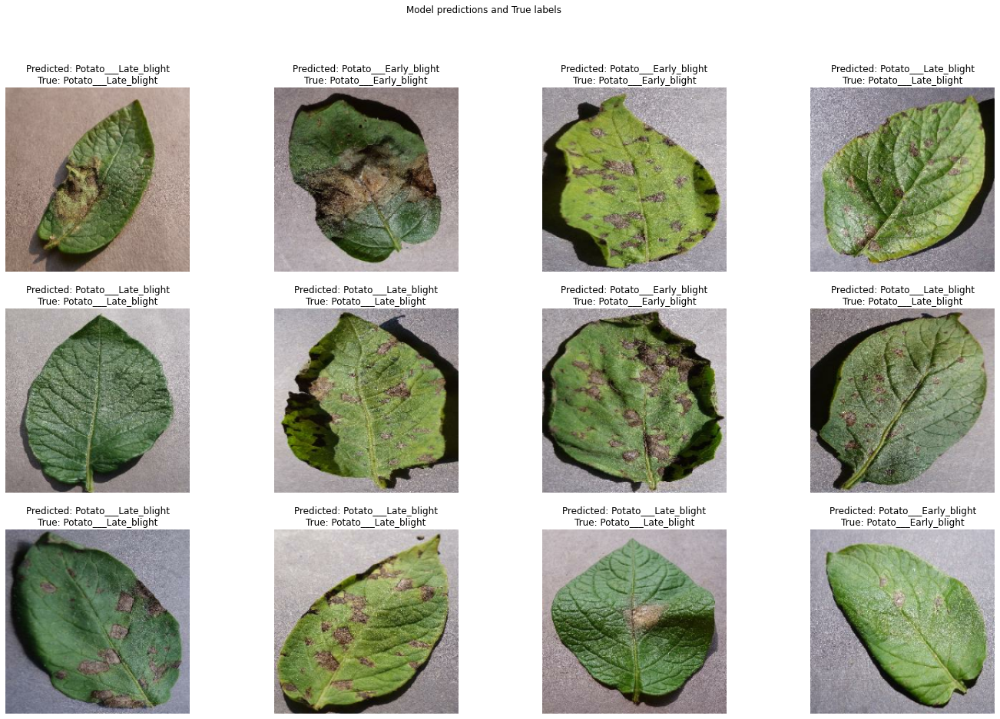

In [ ]:
plt.figure(figsize=(24,15))

for image_batch, label_batch in test_ds.take(1):
  for i in range(12):
    ax = plt.subplot(3,4,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8")) # convert float img data to int since values between [0..255]
    plt.title(f"Predicted: {predicted_label_batch[i]}" + "\n" + f"True: {true_label_batch[i]}")# label_batch[i] provides numerical class value for e.g. 0,1,2
    plt.axis("off")
  _ = plt.suptitle("Model predictions and True labels")

The Finetuned mobilenet_v2 seems to be working quite well for classifying between
- 'Potato Early blight', 'Potato Late blight', 'Potato healthy' 
- 😀 👍

## Checking the mismatch between predictions and true labels

2/2 [==============================] - 0s 43ms/step


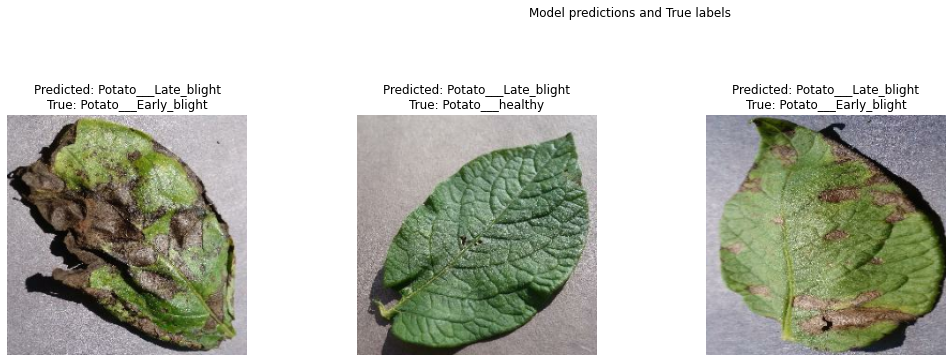

In [ ]:
import numpy as np

plt.figure(figsize=(24,15))

i = 0
for image_batch, label_batch in test_ds.take(-1):

  predicted_batch = model.predict(image_batch)
  predicted_id = tf.math.argmax(predicted_batch, axis=-1).numpy().astype("int32")
  true_id = label_batch.numpy().astype("int32")

  predicted_label_batch = [class_names[id] for id in predicted_id]
  true_label_batch = [class_names[id] for id in true_id]

  idxs = np.where(predicted_id != true_id)

  if len(idxs[0]) > 0: 
    for idx in idxs[0]:
      ax = plt.subplot(3,4,i+1)
      plt.imshow(image_batch[idx].numpy().astype("uint8")) # convert float img data to int since values between [0..255]
      plt.title(f"Predicted: {predicted_label_batch[idx]}" + "\n" + f"True: {true_label_batch[idx]}")# label_batch[i] provides numerical class value for e.g. 0,1,2
      plt.axis("off")
      _ = plt.suptitle("Model predictions and True labels")
      i+=1

- For (Predicted:Late_blight, True: Early_blight): It seems that the model is associating dark brownish spots with Late_blight.
  - Also it seems that model is utilizing pattern of the blight to distinguish between Late_blight and Early_blight, hence in the absence of pattern it seems to be relying on color and predicting spread of brown color as Late_blight

- For (Predicted:Healthy, True: Late_blight): It seems that the model is not able to detect the very small blight spots spread all over the leaf

- For (Predicted:Late_blight, True: Healthy): It seems that perhaps the dark brown background color and hue might be confusing the model to give Late_blight prediction

# Export model using TFLite
Even smaller model size with TFLite optimization

In [ ]:
# Convert to tflite with optimization
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT] # Default optimization
tflite_model = converter.convert()

# Save in the model google drive
drive_export_path = '/content/drive/MyDrive/Colab_Notebooks/Crop_Disease_Classification'
open(f"{drive_export_path}/Finetuned_Mobilenetv2_CropDiseaseClassification_OptimizedSize.tflite", "wb").write(tflite_model)



---

---

---

